# Final analysis 

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import json

import os

In [2]:
import warnings
warnings.filterwarnings(action="ignore")

In [3]:
# dir path
DATA_DIR = '../data/'
RESULT_DIR = '../results/'

In [4]:
%matplotlib inline

In [5]:
pd.set_option('display.max_columns', None)

In [6]:
import nltk

## read data

In [7]:
# read dataset using pandas
raw_data = pd.read_csv(os.path.join(DATA_DIR, "Food_Inspections.csv"), parse_dates=True)

In [8]:
raw_data.columns = [column_name.replace(' ', '_').lower() for column_name in raw_data.columns]

In [9]:
raw_data['inspection_date'] = pd.to_datetime(raw_data.inspection_date)

In [10]:
food_fltrd = raw_data[(raw_data.inspection_date>='2022-01-01') & (raw_data.inspection_date<='2022-12-31')]

# Data analysis

In [11]:
food_fltrd

,inspection_id,dba_name,aka_name,license_#,facility_type,risk,address,city,state,zip,inspection_date,inspection_type,results,violations,latitude,longitude,location
202,2569111,SUBWAY # 26771,SUBWAY,2458696.0,Restaurant,Risk 1 (High),35 W VAN BUREN ST,CHICAGO,IL,60605.0,2022-12-29,Canvass Re-Inspection,Pass,NaN,41.876795,-87.628999,"(41.87679468592167, -87.62899906139144)"
203,2569114,STARBUCKS COFFEE #20797,STARBUCKS,2341106.0,Restaurant,Risk 2 (Medium),3640 N WESTERN AVE,CHICAGO,IL,60618.0,2022-12-30,Canvass,Pass,57. ALL FOOD EMPLOYEES HAVE FOOD HANDLER TRAIN...,41.947947,-87.688440,"(41.94794732437379, -87.68844043392538)"
204,2569116,MCDONALD'S,MCDONALD'S,1332913.0,Restaurant,Risk 2 (Medium),2609 S KEDZIE AVE,CHICAGO,IL,60623.0,2022-12-30,Canvass,Pass,49. NON-FOOD/FOOD CONTACT SURFACES CLEAN - Com...,41.844202,-87.704887,"(41.84420224098303, -87.7048869943916)"
205,2569090,TACOS VELAZQUEZ,TACOS VELAZQUEZ,2886589.0,NaN,Risk 1 (High),1729 N CICERO AVE,CHICAGO,IL,60639.0,2022-12-29,License,Fail,NaN,41.912331,-87.745792,"(41.91233128070664, -87.74579209447246)"
206,2569079,KANELA BREAKFAST CLUB,KANELA BREAKFAST CLUB,2882663.0,Restaurant,Risk 1 (High),1549 N WELLS ST,CHICAGO,IL,60610.0,2022-12-29,License,Pass,NaN,41.910572,-87.634545,"(41.910572111162736, -87.63454539156992)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51009,2549992,TEN CAFE,TEN CAFE,2713537.0,Restaurant,Risk 1 (High),3308 N WESTERN AVE,CHICAGO,IL,60618.0,2022-02-17,Canvass,Pass w/ Conditions,37. FOOD PROPERLY LABELED; ORIGINAL CONTAINER ...,41.941586,-87.688376,"(41.94158571345376, -87.68837619919587)"
51013,2547077,"COMPASS GROUP USA, INC.","COMPASS GROUP USA, INC.",2830631.0,Restaurant,Risk 2 (Medium),233 S WACKER DR,CHICAGO,IL,60606.0,2022-01-28,License,Not Ready,NaN,41.878560,-87.636524,"(41.87856015362371, -87.63652387205532)"
51015,2546675,KIMURA SUSHI,KIMURA SUSHI,2569626.0,Restaurant,Risk 1 (High),1422 W Taylor ST,CHICAGO,IL,60607.0,2022-01-19,Canvass,Pass w/ Conditions,"1. PERSON IN CHARGE PRESENT, DEMONSTRATES KNOW...",41.869434,-87.662647,"(41.86943380987853, -87.66264704407905)"
51016,2546215,"TAQUERIA EL ARCO #3 EL POLLO FELIZ, INC.",EL POLLO CRIS CRIS #3,1964458.0,Restaurant,Risk 1 (High),7023-7025 S PULASKI RD,CHICAGO,IL,60629.0,2022-01-06,Complaint,Fail,"3. MANAGEMENT, FOOD EMPLOYEE AND CONDITIONAL E...",41.765126,-87.722279,"(41.765126421774134, -87.72227898862089)"


In [12]:
food_fltrd.groupby(['address']).agg({'aka_name':[list, 'nunique']}).reset_index()

address  \
                               
0              1 E 113TH ST    
1               1 E 83RD ST    
2               1 E ERIE ST    
3          1 E JACKSON BLVD    
4            1 E PEARSON ST    
...                      ...   
8939     9920 S WESTERN AVE    
8940  9928 S CRANDON AVE FL    
8941    9938 S TORRENCE AVE    
8942   9940 S VINCENNES AVE    
8943     9956 S WESTERN AVE    

                                               aka_name          
                                                   list nunique  
0            [GRAHAM CRACKER'S DAYCARE CENTER II, INC.]       1  
1      [SUBWAY, SUBWAY, SUBWAY, SUBWAY, SUBWAY, SUBWAY]       1  
2                [BRIGHTWOK KITCHEN, BRIGHTWOK KITCHEN]       1  
3     [BARNS AND NOBLE CAFE, Chartwells @ DePaul Uni...       2  
4                [LOYOLA UNIVERSITY, LOYOLA UNIVERSITY]       1  
...                                                 ...     ...  
8939                             [AIN'T SHE SWEET CAFE]       1  
8940                  [BURNHAM MATH AND SCIENCEACADEMY]       1  
8941         [BIG BABY'S SOUTHERN SOUL KITCHEN & GRILL]       1  
8942                   [TAQUERIA MI LINDO DURANGO, INC]       1  
8943                                [FOX'S BEVERLY PUB]       1  

[8944 rows x 3 columns]

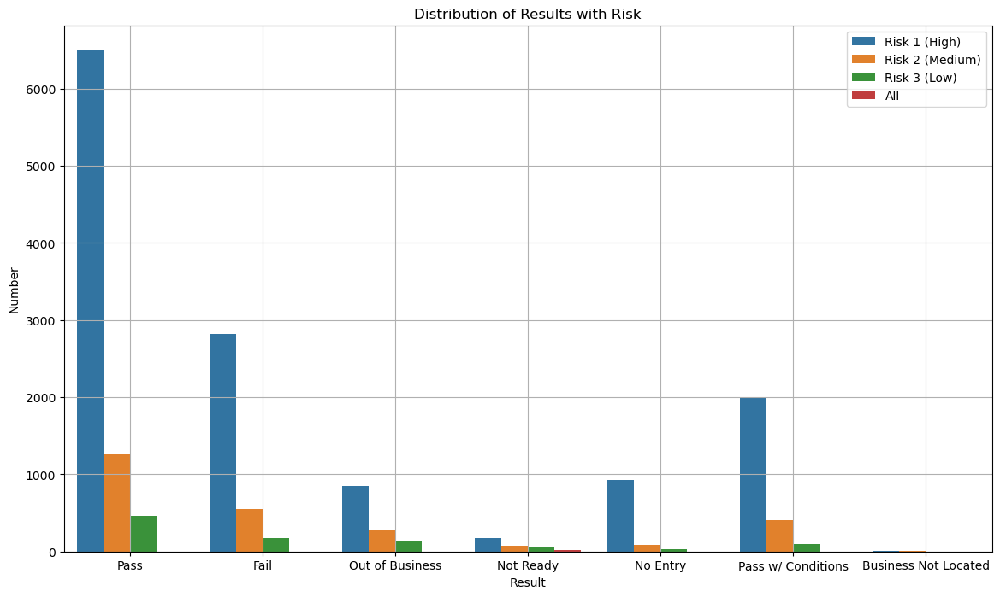

In [13]:
plt.figure(figsize = (14, 8))
ax = sns.countplot(x = 'results', data = food_fltrd, hue="risk")
# ax.bar_label(ax.containers[0])
ax.set(xlabel ="Result", ylabel = "Number", title ='Distribution of Results with Risk')
ax.legend(loc = "upper right")
plt.grid()

In [14]:
food_fltrd.risk.value_counts()

Risk 1 (High)      13265
Risk 2 (Medium)     2682
Risk 3 (Low)         965
All                   15
Name: risk, dtype: int64

In [15]:
agg_df = food_fltrd.groupby(['aka_name', 'inspection_date']).agg({'risk':['count',list]}).reset_index()

In [16]:
agg_df.columns

MultiIndex([(       'aka_name',      ''),
            ('inspection_date',      ''),
            (           'risk', 'count'),
            (           'risk',  'list')],
           )

In [17]:
agg_df.columns = agg_df.columns.map('_'.join)

In [18]:
agg_df

,aka_name_,inspection_date_,risk_count,risk_list
0,#1 CHOP SUEY,2022-01-26,1,[Risk 1 (High)]
1,#1 CHOP SUEY,2022-02-10,1,[Risk 1 (High)]
2,#1 CHOP SUEY,2022-02-18,1,[Risk 1 (High)]
3,#1 CHOP SUEY,2022-03-01,1,[Risk 1 (High)]
4,#1 CHOP SUEY,2022-08-18,1,[Risk 1 (High)]
...,...,...,...,...
15939,de NOBILI,2022-11-25,1,[Risk 1 (High)]
15940,iO Theater,2022-07-06,3,"[Risk 2 (Medium), Risk 3 (Low), Risk 3 (Low)]"
15941,iO Theater,2022-10-06,3,"[Risk 2 (Medium), Risk 3 (Low), Risk 3 (Low)]"
15942,ï¿½ BAR AND GRILL,2022-11-01,1,[Risk 1 (High)]


In [19]:
agg_df.groupby(["risk_count"]).agg({'aka_name_':'nunique'}).reset_index()

,risk_count,aka_name_
0,0,3
1,1,8688
2,2,424
3,3,78
4,4,12
5,5,7
6,7,1
7,8,1
8,12,1


In [20]:
# latest_inspct = food_fltrd.loc[food_fltrd.groupby(['aka_name','license_#']).inspection_date.idxmax()]
latest_inspct = food_fltrd.copy()

In [21]:
lin_plt_df = latest_inspct.groupby('inspection_date').size().reset_index()

<AxesSubplot:xlabel='inspection_date', ylabel='0'>

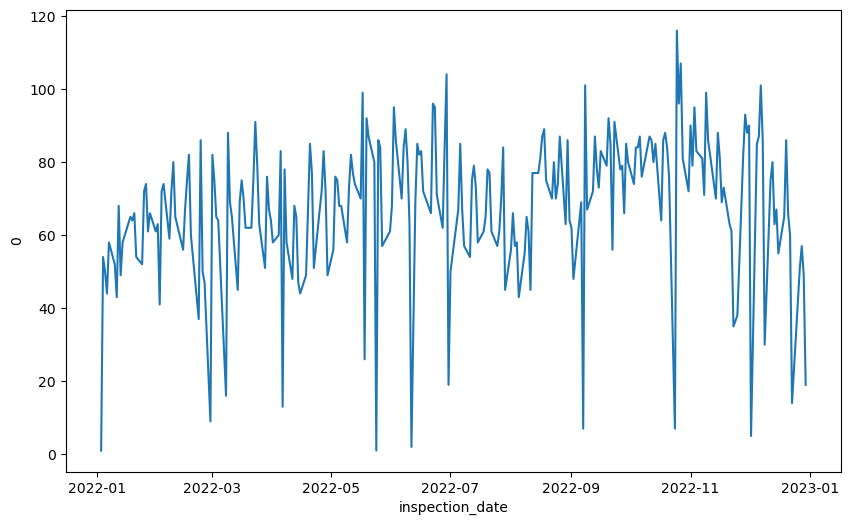

In [22]:
plt.figure(figsize=(10, 6))
date_array  = lin_plt_df['inspection_date']
freq_array = lin_plt_df[0]
sns.lineplot(x = date_array, y = freq_array)

In [23]:
latest_inspct.results.unique()

array(['Pass', 'Fail', 'Out of Business', 'Not Ready', 'No Entry',
       'Pass w/ Conditions', 'Business Not Located'], dtype=object)

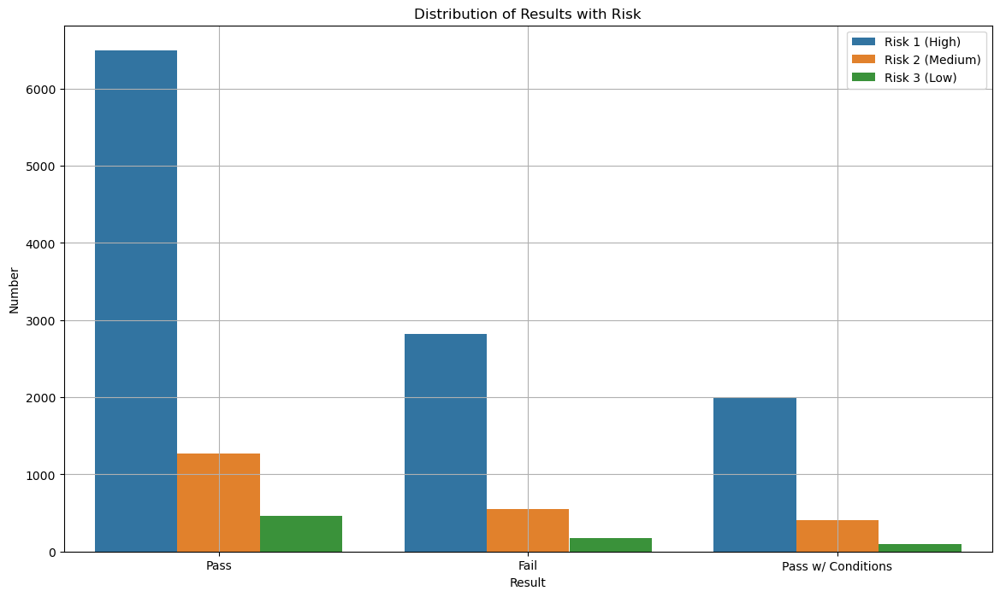

In [24]:
plt.figure(figsize = (14, 8))
ax = sns.countplot(x = 'results', data = latest_inspct[latest_inspct.results.isin(['Pass', 'Fail', 'Pass w/ Conditions'])], hue="risk")
# ax.bar_label(ax.containers[0])
ax.set(xlabel ="Result", ylabel = "Number", title ='Distribution of Results with Risk')
ax.legend(loc = "upper right")
plt.grid()

In [25]:
latest_inspct[(latest_inspct.results=='Pass') & (latest_inspct.risk=='Risk 1 (High)')].groupby(['inspection_type']).size()

inspection_type
Canvass                                   2988
Canvass Re-Inspection                     1502
Complaint                                  442
Complaint Re-Inspection                    454
License                                    653
License Re-Inspection                      263
Non-Inspection                               2
Recent Inspection                           12
Short Form Complaint                       165
Special Events (Festivals)                   1
Suspected Food Poisoning                     7
Suspected Food Poisoning Re-inspection       6
dtype: int64

In [26]:
latest_inspct.head()

,inspection_id,dba_name,aka_name,license_#,facility_type,risk,address,city,state,zip,inspection_date,inspection_type,results,violations,latitude,longitude,location
202,2569111,SUBWAY # 26771,SUBWAY,2458696.0,Restaurant,Risk 1 (High),35 W VAN BUREN ST,CHICAGO,IL,60605.0,2022-12-29,Canvass Re-Inspection,Pass,NaN,41.876795,-87.628999,"(41.87679468592167, -87.62899906139144)"
203,2569114,STARBUCKS COFFEE #20797,STARBUCKS,2341106.0,Restaurant,Risk 2 (Medium),3640 N WESTERN AVE,CHICAGO,IL,60618.0,2022-12-30,Canvass,Pass,57. ALL FOOD EMPLOYEES HAVE FOOD HANDLER TRAIN...,41.947947,-87.688440,"(41.94794732437379, -87.68844043392538)"
204,2569116,MCDONALD'S,MCDONALD'S,1332913.0,Restaurant,Risk 2 (Medium),2609 S KEDZIE AVE,CHICAGO,IL,60623.0,2022-12-30,Canvass,Pass,49. NON-FOOD/FOOD CONTACT SURFACES CLEAN - Com...,41.844202,-87.704887,"(41.84420224098303, -87.7048869943916)"
205,2569090,TACOS VELAZQUEZ,TACOS VELAZQUEZ,2886589.0,NaN,Risk 1 (High),1729 N CICERO AVE,CHICAGO,IL,60639.0,2022-12-29,License,Fail,NaN,41.912331,-87.745792,"(41.91233128070664, -87.74579209447246)"
206,2569079,KANELA BREAKFAST CLUB,KANELA BREAKFAST CLUB,2882663.0,Restaurant,Risk 1 (High),1549 N WELLS ST,CHICAGO,IL,60610.0,2022-12-29,License,Pass,NaN,41.910572,-87.634545,"(41.910572111162736, -87.63454539156992)"


In [27]:
latest_inspct.facility_type.value_counts()

Restaurant                         11812
Grocery Store                       1670
School                              1158
Children's Services Facility         537
Daycare Above and Under 2 Years      256
                                   ...  
SENIOR DAY CARE                        1
Assisted Living Senior Care            1
MOVIE THEATRE                          1
CATERING/BANQUET                       1
DAYCARE 2 YRS TO 12 YRS                1
Name: facility_type, Length: 132, dtype: int64

In [28]:
latest_inspct.violations.value_counts()

58. ALLERGEN TRAINING AS REQUIRED - Comments: OBSERVED THE CITY OF CHICAGO FOOD CERTIFIED MANAGER WITH NO PROOF OF ALLERGEN TRAINING CERTIFICATE. INSTRUCTED ALL CITY OF CHICAGO CERTIFIED FOOD MANAGERS OBTAIN THIS CERTIFICATE.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

In [29]:
latest_inspct['violation_code'] = latest_inspct.violations.str.slice(start=0, stop=3).astype(float)

In [30]:
violation_5 = [10.0, 47.0, 55.0, 49.0, 37.0]

In [31]:
latest_inspct.violation_code

202       NaN
203      57.0
204      49.0
205       NaN
206       NaN
         ... 
51009    37.0
51013     NaN
51015     1.0
51016     3.0
51019    64.0
Name: violation_code, Length: 16933, dtype: float64

In [32]:
latest_inspct[latest_inspct.violation_code.isin([37.0])]['violations'].value_counts()

37. FOOD PROPERLY LABELED; ORIGINAL CONTAINER - Comments: OBSERVED PACKAGED FOOD ITEMS IN GRAB AND GO DISPLAY COOLER NOT PROPERLY LABELED WITH INGREDIENTS, NET WEIGHT, ALLERGENS, BUSINESS NAME AND ADDRESS. INSTRUCTED MANAGER TO PROPERLY LABEL ALL PACKAGED FOODS IN GRAB AND GO DISPLAY COOLER AND MAINTAIN.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

In [33]:
latest_inspct['violation_reason'] = latest_inspct['violations'].str.split('Comments:').str[0]
latest_inspct['violation_comment'] = latest_inspct['violations'].str.split('Comments:').str[1]

In [34]:
list(latest_inspct[latest_inspct.results=='Fail']['violations'][:1])

[nan]

In [35]:
violation_reasn_10 = list(latest_inspct.violation_reason.value_counts()[:10].index)

<AxesSubplot:xlabel='count', ylabel='violation_reason'>

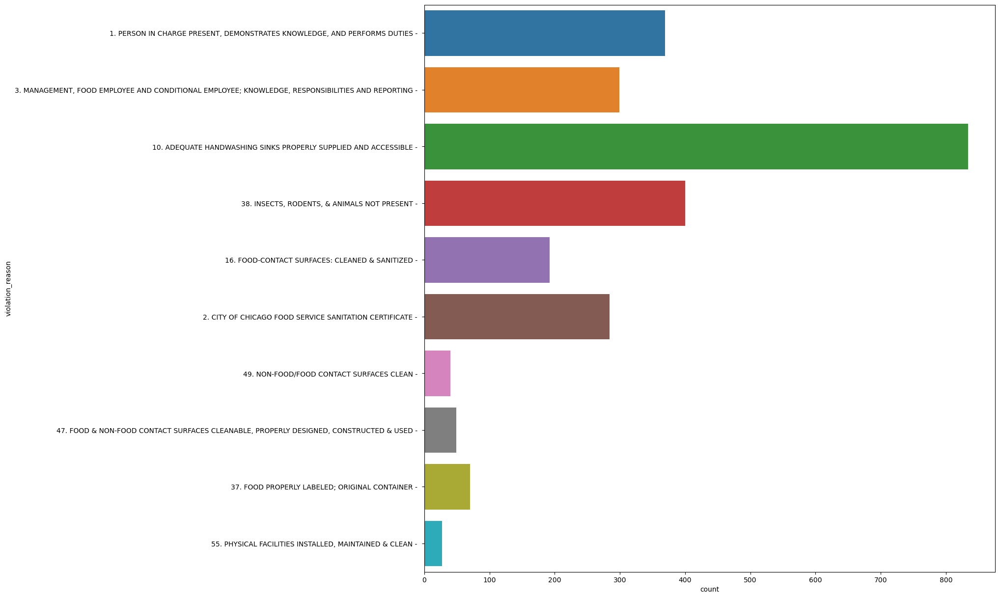

In [36]:
plt.figure(figsize=(15, 15))
sns.countplot(data = latest_inspct[(latest_inspct.results=='Fail')&(latest_inspct.violation_reason.isin(violation_reasn_10))],
              y = 'violation_reason')

<AxesSubplot:xlabel='count', ylabel='violation_reason'>

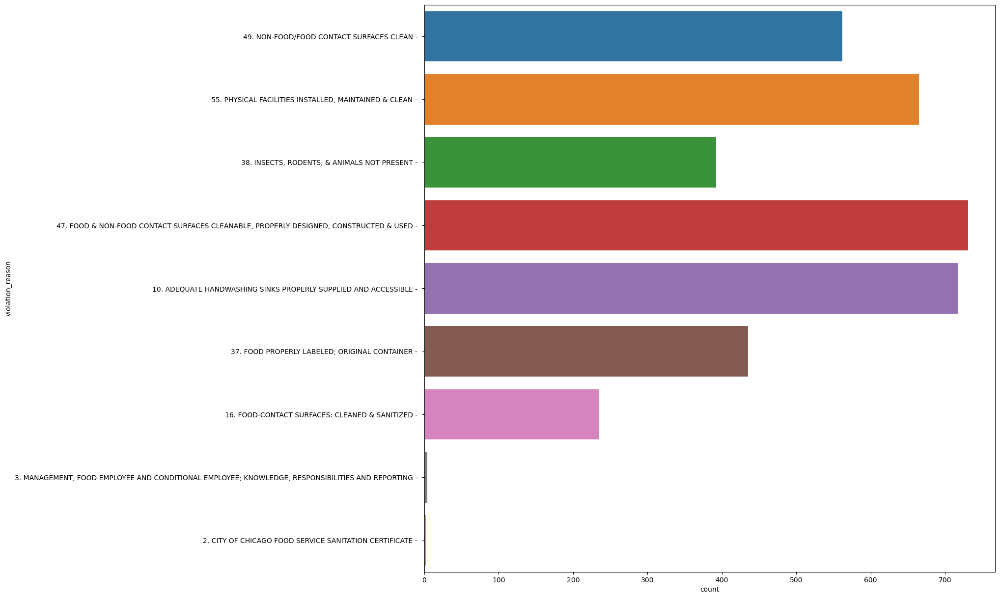

In [37]:
plt.figure(figsize=(15, 15))
sns.countplot(data = latest_inspct[(latest_inspct.results=='Pass')&(latest_inspct.violation_reason.isin(violation_reasn_10))],
              y = 'violation_reason')

In [38]:
text_df = latest_inspct.dropna(subset=['violation_comment'], inplace=False, axis=0)

In [39]:
most_freq_words = pd.Series(" ".join(text_df['violation_comment']).split()).value_counts()

<AxesSubplot:title={'center':'Top 20 Frequent Number Of Words'}>

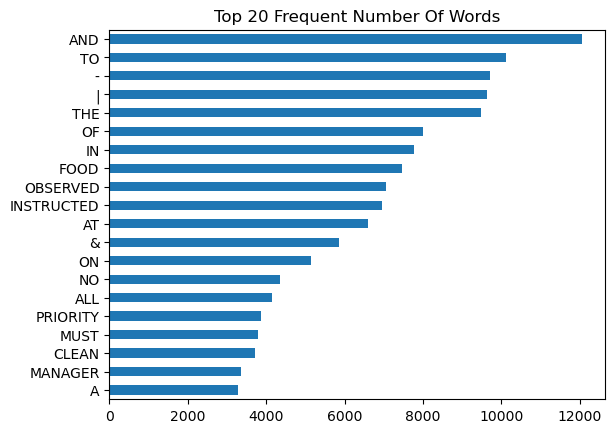

In [40]:
most_freq_words.head(20).sort_values(ascending = True).plot(kind="barh",title = "Top 20 Frequent Number Of Words")

# Text Cleaning

In [41]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
import re
from nltk.corpus import stopwords
from sklearn.model_selection import train_test_split
import nltk
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC, SVC

In [42]:
# To lower case text
text_df['violation_comment'] = text_df.violation_comment.str.lower()

In [43]:
# remove stopwords
nltk.download('stopwords')
stop_words = stopwords.words('english')

[nltk_data] Downloading package stopwords to /home/kush/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [44]:
stop_words[:5]

['i', 'me', 'my', 'myself', 'we']

In [45]:
stop_words = stop_words + ['must', 'provide', 'city', 'chicago', 'manager', 'food',
                           'violation', 'certified', 'certificate', 'citation']

In [46]:
tokenized_doc = text_df['violation_comment'].apply(lambda x: x.split())

In [47]:
# remove stop-words
tokenized_doc = tokenized_doc.apply(lambda x: [item for item in x if item not in stop_words])

In [48]:
text_df['clean_comment'] = tokenized_doc.astype(str).str.replace('\[|\]|\'', '')
text_df['clean_comment'] = text_df.clean_comment.str.replace(",",'')
text_df['clean_comment'] = text_df['clean_comment'].str.replace(r'\d+','')

In [49]:
text_df['clean_comment'] = text_df.clean_comment.str.replace(r'[^\w\s]', '')

In [50]:
def top_n_words(text, n):
    
    most_freq_words = pd.Series(" ".join(text).split()).value_counts()
    return most_freq_words.head(n).sort_values(ascending = True).plot(kind="barh",title = "Top {n} Frequent Number Of Words".format(n = n))

<AxesSubplot:title={'center':'Top 15 Frequent Number Of Words'}>

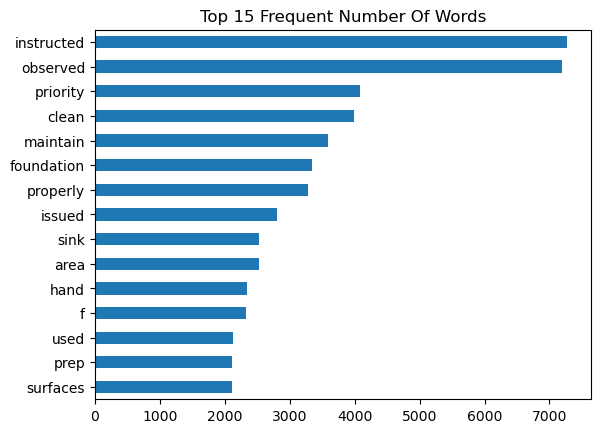

In [51]:
top_n_words(text_df.clean_comment, 15)

In [52]:
from sklearn.feature_extraction.text import CountVectorizer

In [53]:
word_vectorizer = CountVectorizer(ngram_range=(2,2), analyzer='word')

In [54]:
sparse_matrix = word_vectorizer.fit_transform(text_df[text_df.results=='Fail']['clean_comment'])

In [55]:
frequencies = sum(sparse_matrix).toarray()[0]

In [56]:
bi_grams_df = pd.DataFrame(frequencies, index=word_vectorizer.get_feature_names(), columns=['frequency'])

<AxesSubplot:title={'center':'Top 20 Frequent Bi Grams of Failed Inspections'}, xlabel='Frequency', ylabel='Terms'>

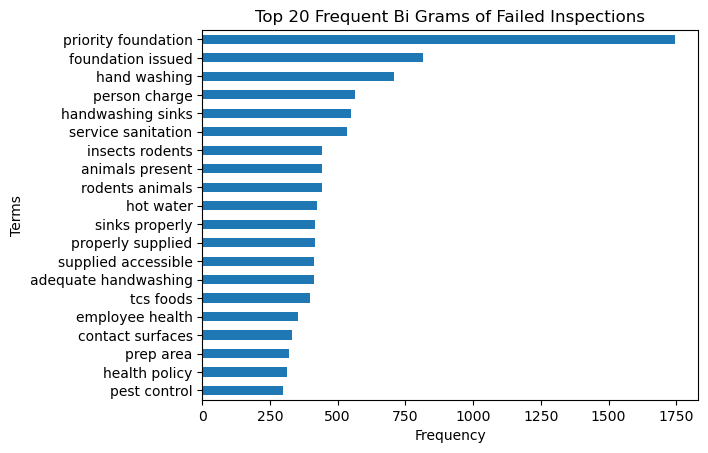

In [57]:
plt.xlabel("Frequency",)
plt.ylabel("Terms")
top20_bigrams = bi_grams_df["frequency"].sort_values(ascending = False).head(20)

top20_bigrams.head(20).sort_values(ascending = True).plot(kind="barh",title = "Top 20 Frequent Bi Grams of Failed Inspections")

## Wordcloud

In [58]:
from wordcloud import WordCloud

In [59]:
text_df.head()

,inspection_id,dba_name,aka_name,license_#,facility_type,risk,address,city,state,zip,inspection_date,inspection_type,results,violations,latitude,longitude,location,violation_code,violation_reason,violation_comment,clean_comment
203,2569114,STARBUCKS COFFEE #20797,STARBUCKS,2341106.0,Restaurant,Risk 2 (Medium),3640 N WESTERN AVE,CHICAGO,IL,60618.0,2022-12-30,Canvass,Pass,57. ALL FOOD EMPLOYEES HAVE FOOD HANDLER TRAIN...,41.947947,-87.688440,"(41.94794732437379, -87.68844043392538)",57.0,57. ALL FOOD EMPLOYEES HAVE FOOD HANDLER TRAIN...,food handlers at premises with no food handle...,handlers premises handler certificates provide
204,2569116,MCDONALD'S,MCDONALD'S,1332913.0,Restaurant,Risk 2 (Medium),2609 S KEDZIE AVE,CHICAGO,IL,60623.0,2022-12-30,Canvass,Pass,49. NON-FOOD/FOOD CONTACT SURFACES CLEAN - Com...,41.844202,-87.704887,"(41.84420224098303, -87.7048869943916)",49.0,49. NON-FOOD/FOOD CONTACT SURFACES CLEAN -,observed build up on exterior of ice coffee m...,observed build exterior ice coffee machine sof...
209,2569070,KEDZIE GROCERY,KEDZIE GROCERY,2882190.0,Grocery Store,Risk 3 (Low),4617-4619 N KEDZIE AVE,CHICAGO,IL,60625.0,2022-12-29,License,Pass,51. PLUMBING INSTALLED; PROPER BACKFLOW DEVICE...,41.965237,-87.708227,"(41.96523653337399, -87.70822685098508)",51.0,51. PLUMBING INSTALLED; PROPER BACKFLOW DEVICE...,observed no backflow prevention device for ut...,observed backflow prevention device utility si...
210,2569062,YO'S YUMMY'S CATERING/RESTAURANT,YO'S YUMMY'S CATERING/RESTAURANT,2876912.0,Catering,Risk 1 (High),4800 W CHICAGO AVE BLDG,CHICAGO,IL,60651.0,2022-12-28,License,Fail,36. THERMOMETERS PROVIDED & ACCURATE - Comment...,41.895112,-87.745932,"(41.89511221857764, -87.74593242701515)",36.0,36. THERMOMETERS PROVIDED & ACCURATE -,observed no metal stem probe thermometer on t...,observed metal stem probe thermometer premises...
211,2569058,NORI & WASABI,NORI & WASABI,2658824.0,Restaurant,Risk 1 (High),3109 N HALSTED ST,CHICAGO,IL,60657.0,2022-12-28,Canvass,Pass,"55. PHYSICAL FACILITIES INSTALLED, MAINTAINED ...",41.938182,-87.649070,"(41.938181501829405, -87.6490696793741)",55.0,"55. PHYSICAL FACILITIES INSTALLED, MAINTAINED ...",noted dirty and dusty ceiling tiles at the re...,noted dirty dusty ceiling tiles rear prep area...


In [60]:
#Creating the text variable
pass_text = " ".join(cat for cat in text_df[(text_df.results=='Pass')].clean_comment)
fail_text = " ".join(cat for cat in text_df[(text_df.results=='Fail')].clean_comment)

In [61]:
# Creating word_cloud with text as argument in .generate() method
pass_word_cloud = WordCloud(collocations = False, collocation_threshold=3, background_color="white", width=800, height=400).generate(pass_text)

fail_word_cloud = WordCloud(collocations = False, collocation_threshold=3,  background_color="white", width=800, height=400).generate(fail_text)

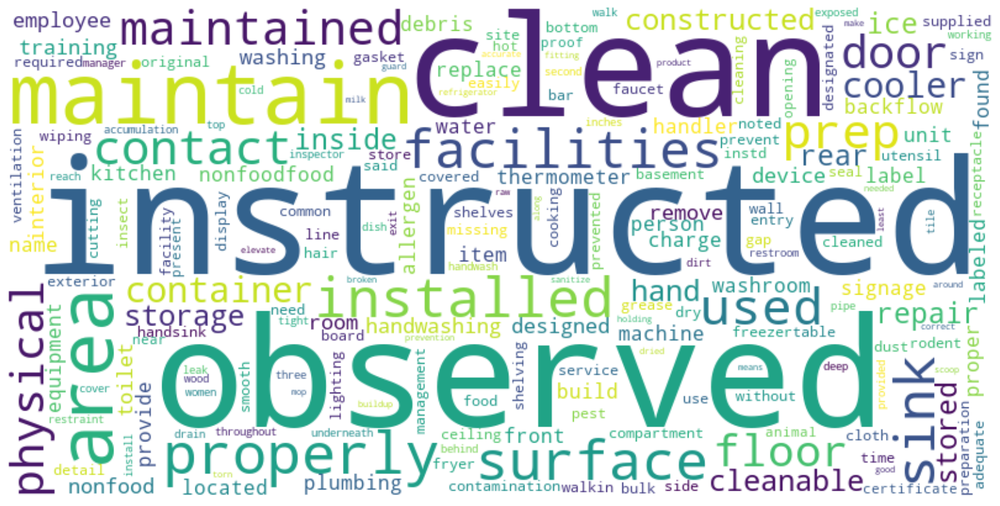

In [62]:
# Display the generated Word Cloud
plt.figure( figsize=(20,10) )
plt.imshow(pass_word_cloud, interpolation='bilinear', )
plt.axis("off")
plt.show()

(-0.5, 799.5, 399.5, -0.5)

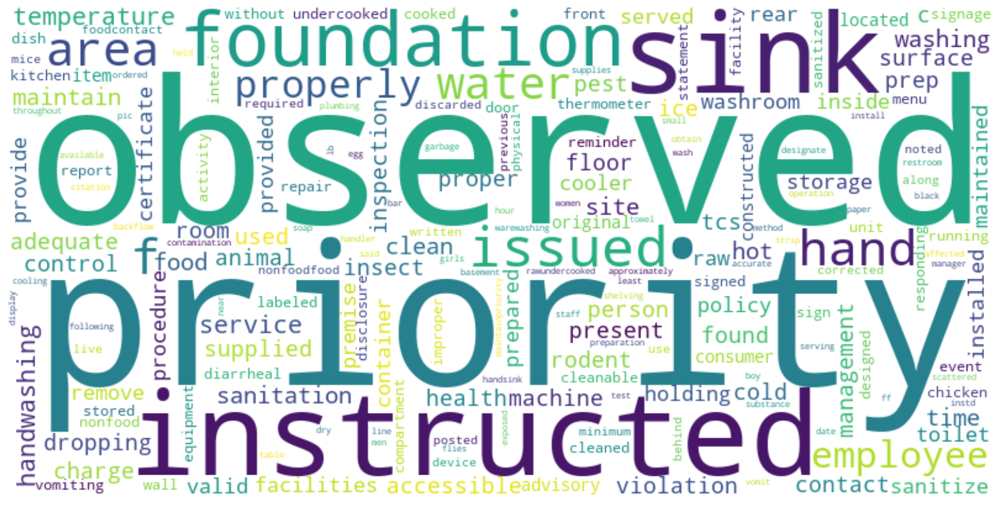

In [63]:
plt.figure( figsize=(20,10) )
plt.imshow(fail_word_cloud, interpolation='bilinear')
plt.axis("off")

In [64]:
#Using count vectoriser to view the frequency of bigrams
bag_of_words = word_vectorizer.fit_transform(text_df[text_df.results=='Fail'].clean_comment)

In [65]:
sum_words = bag_of_words.sum(axis=0) 
words_freq = [(word, sum_words[0, idx]) for word, idx in word_vectorizer.vocabulary_.items()]
words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
print (words_freq[:100])

[('priority foundation', 1744), ('foundation issued', 816), ('hand washing', 707), ('person charge', 564), ('handwashing sinks', 548), ('service sanitation', 535), ('insects rodents', 443), ('rodents animals', 442), ('animals present', 442), ('hot water', 425), ('sinks properly', 415), ('properly supplied', 415), ('adequate handwashing', 414), ('supplied accessible', 414), ('tcs foods', 396), ('employee health', 354), ('contact surfaces', 332), ('prep area', 322), ('health policy', 314), ('pest control', 299), ('foundation violation', 274), ('washing sinks', 265), ('priority issued', 256), ('water temperature', 255), ('issued adequate', 252), ('violation issued', 248), ('washing sink', 247), ('consumer advisory', 232), ('handwashing sink', 224), ('times priority', 210), ('time inspection', 209), ('ice machine', 207), ('observed hand', 205), ('prepared served', 202), ('diarrheal events', 201), ('facilities installed', 201), ('installed maintained', 201), ('cold holding', 197), ('managem

In [66]:
words_dict = dict(words_freq)
WC_height = 1000
WC_width = 1500
WC_max_words = 200
wordCloud = WordCloud(max_words=WC_max_words, height=WC_height, width=WC_width,
                      collocation_threshold=3, background_color="white", 
                     colormap="plasma")

(-0.5, 1499.5, 999.5, -0.5)

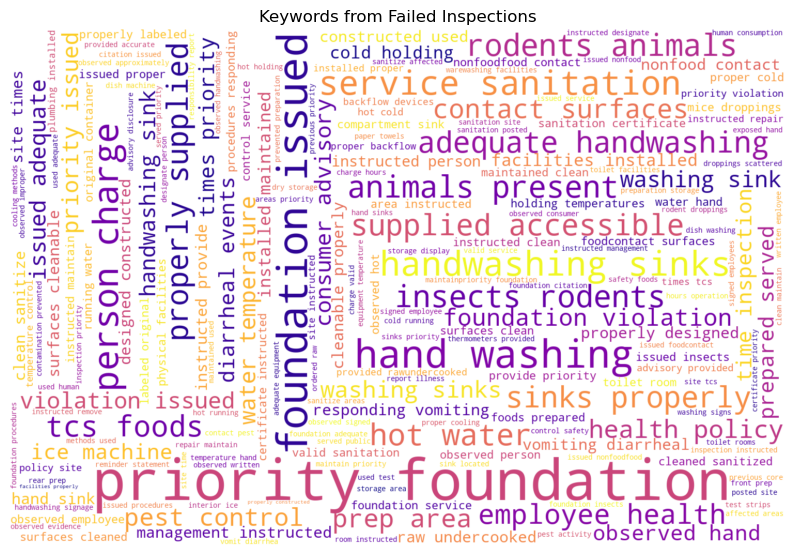

In [67]:
plt.figure(figsize=(10, 8))
wordCloud.generate_from_frequencies(words_dict)
plt.imshow(wordCloud, interpolation='bilinear')
plt.title("Keywords from Failed Inspections")
plt.axis("off")

In [68]:
#Using count vectoriser to view the frequency of bigrams
bag_of_words = word_vectorizer.fit_transform(text_df[text_df.results=='Pass'].clean_comment)

In [69]:
sum_words = bag_of_words.sum(axis=0) 
words_freq = [(word, sum_words[0, idx]) for word, idx in word_vectorizer.vocabulary_.items()]
words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
print (words_freq[:100])

[('contact surfaces', 1054), ('facilities installed', 989), ('installed maintained', 989), ('physical facilities', 965), ('maintained clean', 965), ('clean maintain', 677), ('prep area', 588), ('nonfood contact', 586), ('properly designed', 565), ('designed constructed', 565), ('surfaces cleanable', 564), ('cleanable properly', 564), ('constructed used', 564), ('hand washing', 532), ('instructed clean', 463), ('surfaces clean', 458), ('nonfoodfood contact', 453), ('area instructed', 435), ('person charge', 400), ('plumbing installed', 393), ('installed proper', 393), ('proper backflow', 393), ('backflow devices', 393), ('allergen training', 389), ('instructed person', 378), ('ice machine', 327), ('maintain physical', 325), ('instructed repair', 310), ('handwashing signage', 310), ('repair maintain', 271), ('compartment sink', 265), ('instructed provide', 247), ('toilet facilities', 235), ('facilities properly', 235), ('properly constructed', 235), ('constructed supplied', 235), ('suppl

In [70]:
words_dict = dict(words_freq)
WC_height = 1000
WC_width = 1500
WC_max_words = 200
wordCloud = WordCloud(max_words=WC_max_words, height=WC_height, width=WC_width,
                      collocation_threshold=3, background_color="white")

(-0.5, 1499.5, 999.5, -0.5)

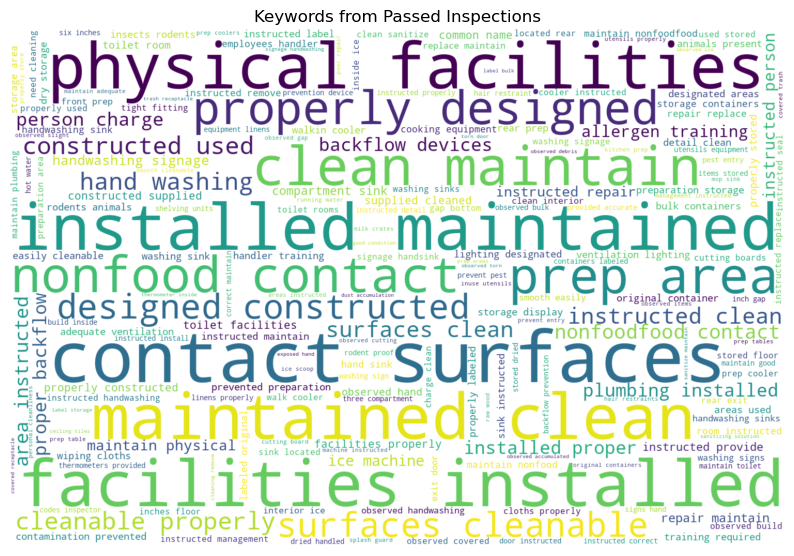

In [71]:
plt.figure(figsize=(10, 8))
wordCloud.generate_from_frequencies(words_dict)
plt.imshow(wordCloud, interpolation='bilinear')
plt.title("Keywords from Passed Inspections")
plt.axis("off")

# Geospatial

In [72]:
latest_inspct = latest_inspct.dropna(subset=['latitude', 'longitude'], axis = 0)

In [73]:
import folium
from folium import plugins

In [74]:
map_attributions = ('&copy; <a href="http://www.openstreetmap.org/copyright">OpenStreetMap</a> '
        'contributors, &copy; <a href="http://cartodb.com/attributions">CartoDB</a>')

In [75]:
latest_inspct.head()

,inspection_id,dba_name,aka_name,license_#,facility_type,risk,address,city,state,zip,inspection_date,inspection_type,results,violations,latitude,longitude,location,violation_code,violation_reason,violation_comment
202,2569111,SUBWAY # 26771,SUBWAY,2458696.0,Restaurant,Risk 1 (High),35 W VAN BUREN ST,CHICAGO,IL,60605.0,2022-12-29,Canvass Re-Inspection,Pass,NaN,41.876795,-87.628999,"(41.87679468592167, -87.62899906139144)",NaN,NaN,NaN
203,2569114,STARBUCKS COFFEE #20797,STARBUCKS,2341106.0,Restaurant,Risk 2 (Medium),3640 N WESTERN AVE,CHICAGO,IL,60618.0,2022-12-30,Canvass,Pass,57. ALL FOOD EMPLOYEES HAVE FOOD HANDLER TRAIN...,41.947947,-87.688440,"(41.94794732437379, -87.68844043392538)",57.0,57. ALL FOOD EMPLOYEES HAVE FOOD HANDLER TRAIN...,FOOD HANDLERS AT PREMISES WITH NO FOOD HANDLE...
204,2569116,MCDONALD'S,MCDONALD'S,1332913.0,Restaurant,Risk 2 (Medium),2609 S KEDZIE AVE,CHICAGO,IL,60623.0,2022-12-30,Canvass,Pass,49. NON-FOOD/FOOD CONTACT SURFACES CLEAN - Com...,41.844202,-87.704887,"(41.84420224098303, -87.7048869943916)",49.0,49. NON-FOOD/FOOD CONTACT SURFACES CLEAN -,OBSERVED BUILD UP ON EXTERIOR OF ICE COFFEE M...
205,2569090,TACOS VELAZQUEZ,TACOS VELAZQUEZ,2886589.0,NaN,Risk 1 (High),1729 N CICERO AVE,CHICAGO,IL,60639.0,2022-12-29,License,Fail,NaN,41.912331,-87.745792,"(41.91233128070664, -87.74579209447246)",NaN,NaN,NaN
206,2569079,KANELA BREAKFAST CLUB,KANELA BREAKFAST CLUB,2882663.0,Restaurant,Risk 1 (High),1549 N WELLS ST,CHICAGO,IL,60610.0,2022-12-29,License,Pass,NaN,41.910572,-87.634545,"(41.910572111162736, -87.63454539156992)",NaN,NaN,NaN


In [76]:
latest_inspct.head()

,inspection_id,dba_name,aka_name,license_#,facility_type,risk,address,city,state,zip,inspection_date,inspection_type,results,violations,latitude,longitude,location,violation_code,violation_reason,violation_comment
202,2569111,SUBWAY # 26771,SUBWAY,2458696.0,Restaurant,Risk 1 (High),35 W VAN BUREN ST,CHICAGO,IL,60605.0,2022-12-29,Canvass Re-Inspection,Pass,NaN,41.876795,-87.628999,"(41.87679468592167, -87.62899906139144)",NaN,NaN,NaN
203,2569114,STARBUCKS COFFEE #20797,STARBUCKS,2341106.0,Restaurant,Risk 2 (Medium),3640 N WESTERN AVE,CHICAGO,IL,60618.0,2022-12-30,Canvass,Pass,57. ALL FOOD EMPLOYEES HAVE FOOD HANDLER TRAIN...,41.947947,-87.688440,"(41.94794732437379, -87.68844043392538)",57.0,57. ALL FOOD EMPLOYEES HAVE FOOD HANDLER TRAIN...,FOOD HANDLERS AT PREMISES WITH NO FOOD HANDLE...
204,2569116,MCDONALD'S,MCDONALD'S,1332913.0,Restaurant,Risk 2 (Medium),2609 S KEDZIE AVE,CHICAGO,IL,60623.0,2022-12-30,Canvass,Pass,49. NON-FOOD/FOOD CONTACT SURFACES CLEAN - Com...,41.844202,-87.704887,"(41.84420224098303, -87.7048869943916)",49.0,49. NON-FOOD/FOOD CONTACT SURFACES CLEAN -,OBSERVED BUILD UP ON EXTERIOR OF ICE COFFEE M...
205,2569090,TACOS VELAZQUEZ,TACOS VELAZQUEZ,2886589.0,NaN,Risk 1 (High),1729 N CICERO AVE,CHICAGO,IL,60639.0,2022-12-29,License,Fail,NaN,41.912331,-87.745792,"(41.91233128070664, -87.74579209447246)",NaN,NaN,NaN
206,2569079,KANELA BREAKFAST CLUB,KANELA BREAKFAST CLUB,2882663.0,Restaurant,Risk 1 (High),1549 N WELLS ST,CHICAGO,IL,60610.0,2022-12-29,License,Pass,NaN,41.910572,-87.634545,"(41.910572111162736, -87.63454539156992)",NaN,NaN,NaN


In [77]:
zip_map_df = latest_inspct[latest_inspct.results.isin(['Pass', 'Fail', 'Pass w/ Conditions'])]

In [78]:
zip_count_df = zip_map_df.groupby(['zip', 'results']).size().reset_index().rename({0:'Count'}, axis=1)

In [79]:
zip_count_df.head()

,zip,results,Count
0,60601.0,Fail,41
1,60601.0,Pass,115
2,60601.0,Pass w/ Conditions,66
3,60602.0,Fail,26
4,60602.0,Pass,55


In [80]:
boundary_file = os.path.join(DATA_DIR, "Boundaries - ZIP Codes.geojson")
with open(boundary_file, 'r') as f:
    zipcode_boundary = json.load(f)

In [81]:
zip_count_df.zip = zip_count_df.zip.astype(int).astype(str)

In [82]:
basemap = folium.Map(location=[41.85, -87.68],
                         control_scale=True,
                     tiles='Cartodb Positron', 
                     attr = map_attributions,
                         zoom_start=10)

In [83]:
# Create choropleth map  
folium.Choropleth(
    geo_data=zipcode_boundary,
    name='choropleth',
    data=zip_count_df[zip_count_df.results=='Fail'],
    columns=['zip', 'Count'],
    key_on='feature.properties.zip',
    fill_color='OrRd',
    fill_opacity=0.6,
    nan_fill_opacity=0,
    line_opacity=1,
    legend_name='Inspection Failed count'
).add_to(basemap)

In [84]:
# for lat,lon,name,tip in zip(latest_inspct['latitude'], latest_inspct['longitude'], latest_inspct['dba_name'], latest_inspct['zip']):
#     folium.Marker(location=[lat,lon], tooltip = tip, popup = name).add_to(basemap)

In [85]:
cnt_df = zip_map_df.groupby(['zip']).agg(meanLat=('latitude', 'mean'),
                                         meanLong=('longitude', 'mean'), 
                                        count_inspect=('latitude', 'count')).reset_index()

In [86]:
cnt_df.zip = cnt_df.zip.astype(int).astype(str)

In [87]:
pivot_df = pd.pivot(data = zip_count_df, index = 'zip', columns=['results'], values=['Count']).reset_index()

In [88]:
pivot_df.columns = pivot_df.columns.map('_'.join)

In [89]:
pivot_df

,zip_,Count_Fail,Count_Pass,Count_Pass w/ Conditions
0,60601,41.0,115.0,66.0
1,60602,26.0,55.0,24.0
2,60603,23.0,54.0,43.0
3,60604,26.0,54.0,17.0
4,60605,83.0,130.0,33.0
5,60606,80.0,118.0,58.0
6,60607,92.0,262.0,141.0
7,60608,122.0,220.0,37.0
8,60609,80.0,192.0,36.0
9,60610,58.0,190.0,64.0


In [90]:
viz_df = pivot_df.merge(cnt_df, how = 'left', left_on='zip_', right_on='zip')

In [91]:
viz_df

,zip_,Count_Fail,Count_Pass,Count_Pass w/ Conditions,zip,meanLat,meanLong,count_inspect
0,60601,41.0,115.0,66.0,60601,41.885955,-87.624724,222
1,60602,26.0,55.0,24.0,60602,41.882735,-87.628948,105
2,60603,23.0,54.0,43.0,60603,41.880655,-87.627844,120
3,60604,26.0,54.0,17.0,60604,41.878214,-87.628314,97
4,60605,83.0,130.0,33.0,60605,41.870547,-87.626886,246
5,60606,80.0,118.0,58.0,60606,41.881543,-87.636165,256
6,60607,92.0,262.0,141.0,60607,41.878483,-87.652397,495
7,60608,122.0,220.0,37.0,60608,41.852276,-87.667328,379
8,60609,80.0,192.0,36.0,60609,41.811350,-87.658956,308
9,60610,58.0,190.0,64.0,60610,41.903453,-87.634232,312


In [92]:
for lat, lan, zip_cd, inspect_cnt, pass_cnt, fail_cnt, pass_w_cond_cnt in zip(viz_df['meanLat'], viz_df['meanLong'], 
                                                                              viz_df['zip'], 
                                                                      viz_df['count_inspect'], viz_df['Count_Pass'], 
                                                                      viz_df["Count_Fail"], viz_df["Count_Pass w/ Conditions"]):    

    popContent = ("Zip Code: " + str(zip_cd) + '<br>' +\
                  "Total Inspection: " + str(inspect_cnt) + '<br>'+\
                  "Pass: " + str(pass_cnt) + '<br>' +\
                  "Inspections Failed: " + str(fail_cnt) + '<br>' +\
                  "Pass w/ Condition: " + str(pass_w_cond_cnt))
    iframe = folium.IFrame(popContent)
    popup1 = folium.Popup(iframe,
                         min_width=200,
                         max_width=200, )   
    
    folium.Marker(location=[lat,lan],popup = popup1, ).add_to(basemap)

In [93]:
basemap

In [94]:
basemap.save(os.path.join(RESULT_DIR, 'InspectionDetails_2022.html'))

# Neighbourhood boundaries

In [95]:
import geopandas as gpd
from shapely.geometry import Point

In [96]:
neighbourhd_gpd = gpd.read_file(os.path.join(DATA_DIR, 'Boundaries - Neighborhoods.geojson'), driver='GeoJSON')

In [97]:
neighbourhd_gpd

,pri_neigh,sec_neigh,shape_area,shape_len,geometry
0,Grand Boulevard,BRONZEVILLE,48492503.1554,28196.837157,"MULTIPOLYGON (((-87.60671 41.81681, -87.60670 ..."
1,Printers Row,PRINTERS ROW,2162137.97139,6864.247156,"MULTIPOLYGON (((-87.62761 41.87437, -87.62760 ..."
2,United Center,UNITED CENTER,32520512.7053,23101.363745,"MULTIPOLYGON (((-87.66707 41.88885, -87.66707 ..."
3,Sheffield & DePaul,SHEFFIELD & DEPAUL,10482592.2987,13227.049745,"MULTIPOLYGON (((-87.65833 41.92166, -87.65835 ..."
4,Humboldt Park,HUMBOLDT PARK,125010425.593,46126.751351,"MULTIPOLYGON (((-87.74060 41.88782, -87.74060 ..."
...,...,...,...,...,...
93,Belmont Cragin,"BELMONT CRAGIN,HERMOSA",109099407.211,43311.706886,"MULTIPOLYGON (((-87.74143 41.91698, -87.74141 ..."
94,Austin,AUSTIN,170037750.826,55473.345911,"MULTIPOLYGON (((-87.75620 41.91547, -87.75588 ..."
95,Gold Coast,GOLD COAST,7165705.53467,13685.479377,"MULTIPOLYGON (((-87.62646 41.91147, -87.62640 ..."
96,Boystown,BOYSTOWN,3365778.97115,9780.268985,"MULTIPOLYGON (((-87.64878 41.93999, -87.64927 ..."


In [98]:
neighbourhd_gpd.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

<AxesSubplot:>

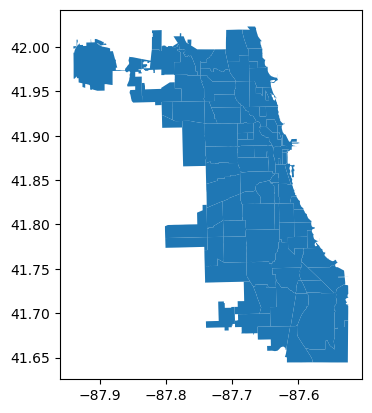

In [99]:
neighbourhd_gpd.plot()

In [100]:
geometry = [Point(xy) for xy in zip(latest_inspct.longitude, latest_inspct.latitude)]

In [101]:
latest_gdf = gpd.GeoDataFrame(latest_inspct, crs="EPSG:4326", geometry=geometry)

In [102]:
inspect_wd_neighbrhd = gpd.sjoin(latest_gdf, neighbourhd_gpd, how = 'left')

In [103]:
latest_inspct.shape

(16863, 21)

## Plotting neighbourhoods

In [104]:
inspect_wd_neighbrhd = inspect_wd_neighbrhd

In [189]:
neigh_count_df = inspect_wd_neighbrhd.groupby(['pri_neigh', 'results']).size().reset_index().rename({0:'Count'}, axis=1)

In [190]:
neigh_count_df

,pri_neigh,results,Count
0,Albany Park,Fail,55
1,Albany Park,No Entry,18
2,Albany Park,Not Ready,2
3,Albany Park,Out of Business,23
4,Albany Park,Pass,129
...,...,...,...
543,Wrigleyville,No Entry,16
544,Wrigleyville,Not Ready,6
545,Wrigleyville,Out of Business,10
546,Wrigleyville,Pass,74


In [191]:
neighbourhd_gpd[['pri_neigh', 'geometry']].dtypes

pri_neigh      object
geometry     geometry
dtype: object

In [192]:
neigh_count_df = neigh_count_df.merge(neighbourhd_gpd[['pri_neigh', 'geometry']], how='left', on = 'pri_neigh')

In [193]:
with open(os.path.join(DATA_DIR, 'Boundaries - Neighborhoods.geojson'), 'r') as f:
    neighbourhd_boundary = json.load(f)

In [194]:
cnt_df = inspect_wd_neighbrhd.groupby(['pri_neigh']).agg(meanLat=('latitude', 'mean'),
                                         meanLong=('longitude', 'mean'), 
                                        count_inspect=('latitude', 'count')).reset_index()

In [195]:
pivot_df = pd.pivot(data = neigh_count_df, index = 'pri_neigh', columns=['results'], values=['Count']).reset_index()

In [196]:
pivot_df.columns = pivot_df.columns.map('_'.join)

In [197]:
viz_df = pivot_df.merge(cnt_df, how = 'left', left_on='pri_neigh_', right_on='pri_neigh')

In [198]:
viz_df

,pri_neigh_,Count_Business Not Located,Count_Fail,Count_No Entry,Count_Not Ready,Count_Out of Business,Count_Pass,Count_Pass w/ Conditions,pri_neigh,meanLat,meanLong,count_inspect
0,Albany Park,NaN,55.0,18.0,2.0,23.0,129.0,53.0,Albany Park,41.966852,-87.719554,280
1,Andersonville,NaN,10.0,10.0,NaN,4.0,49.0,7.0,Andersonville,41.979709,-87.668608,80
2,Archer Heights,NaN,31.0,4.0,4.0,5.0,36.0,13.0,Archer Heights,41.806869,-87.726830,93
3,Armour Square,NaN,4.0,2.0,2.0,5.0,25.0,5.0,Armour Square,41.837345,-87.633848,43
4,Ashburn,NaN,44.0,2.0,3.0,14.0,78.0,13.0,Ashburn,41.745738,-87.708202,154
...,...,...,...,...,...,...,...,...,...,...,...,...
93,West Ridge,NaN,63.0,21.0,6.0,31.0,211.0,37.0,West Ridge,41.999649,-87.692900,369
94,West Town,NaN,46.0,29.0,8.0,12.0,158.0,49.0,West Town,41.896250,-87.664101,302
95,Wicker Park,NaN,58.0,21.0,5.0,27.0,131.0,52.0,Wicker Park,41.908306,-87.677409,294
96,Woodlawn,NaN,9.0,1.0,3.0,7.0,42.0,12.0,Woodlawn,41.779326,-87.602736,74


In [199]:
viz_df.count_inspect.sum()

16701

In [200]:
viz_df['Failed_pcnt'] = np.round((viz_df['Count_Fail']/viz_df['count_inspect'].sum())*100, 2)

In [201]:
viz_df

,pri_neigh_,Count_Business Not Located,Count_Fail,Count_No Entry,Count_Not Ready,Count_Out of Business,Count_Pass,Count_Pass w/ Conditions,pri_neigh,meanLat,meanLong,count_inspect,Failed_pcnt
0,Albany Park,NaN,55.0,18.0,2.0,23.0,129.0,53.0,Albany Park,41.966852,-87.719554,280,0.33
1,Andersonville,NaN,10.0,10.0,NaN,4.0,49.0,7.0,Andersonville,41.979709,-87.668608,80,0.06
2,Archer Heights,NaN,31.0,4.0,4.0,5.0,36.0,13.0,Archer Heights,41.806869,-87.726830,93,0.19
3,Armour Square,NaN,4.0,2.0,2.0,5.0,25.0,5.0,Armour Square,41.837345,-87.633848,43,0.02
4,Ashburn,NaN,44.0,2.0,3.0,14.0,78.0,13.0,Ashburn,41.745738,-87.708202,154,0.26
...,...,...,...,...,...,...,...,...,...,...,...,...,...
93,West Ridge,NaN,63.0,21.0,6.0,31.0,211.0,37.0,West Ridge,41.999649,-87.692900,369,0.38
94,West Town,NaN,46.0,29.0,8.0,12.0,158.0,49.0,West Town,41.896250,-87.664101,302,0.28
95,Wicker Park,NaN,58.0,21.0,5.0,27.0,131.0,52.0,Wicker Park,41.908306,-87.677409,294,0.35
96,Woodlawn,NaN,9.0,1.0,3.0,7.0,42.0,12.0,Woodlawn,41.779326,-87.602736,74,0.05


In [202]:
from sklearn.preprocessing import MinMaxScaler

In [203]:
scaler = MinMaxScaler()

In [204]:
perc_vals = scaler.fit_transform(viz_df[['Failed_pcnt']])

In [205]:
viz_df['norm_fail_pcnt'] = pd.DataFrame(perc_vals)[0]

In [206]:
viz_df.drop('pri_neigh_', axis=1, inplace=True)

In [207]:
neigh_count_df = neigh_count_df.merge(viz_df, how = "left", on='pri_neigh')

In [208]:
neigh_count_df

,pri_neigh,results,Count,geometry,Count_Business Not Located,Count_Fail,Count_No Entry,Count_Not Ready,Count_Out of Business,Count_Pass,Count_Pass w/ Conditions,meanLat,meanLong,count_inspect,Failed_pcnt,norm_fail_pcnt
0,Albany Park,Fail,55,"MULTIPOLYGON (((-87.70404 41.97355, -87.70403 ...",NaN,55.0,18.0,2.0,23.0,129.0,53.0,41.966852,-87.719554,280,0.33,0.238806
1,Albany Park,No Entry,18,"MULTIPOLYGON (((-87.70404 41.97355, -87.70403 ...",NaN,55.0,18.0,2.0,23.0,129.0,53.0,41.966852,-87.719554,280,0.33,0.238806
2,Albany Park,Not Ready,2,"MULTIPOLYGON (((-87.70404 41.97355, -87.70403 ...",NaN,55.0,18.0,2.0,23.0,129.0,53.0,41.966852,-87.719554,280,0.33,0.238806
3,Albany Park,Out of Business,23,"MULTIPOLYGON (((-87.70404 41.97355, -87.70403 ...",NaN,55.0,18.0,2.0,23.0,129.0,53.0,41.966852,-87.719554,280,0.33,0.238806
4,Albany Park,Pass,129,"MULTIPOLYGON (((-87.70404 41.97355, -87.70403 ...",NaN,55.0,18.0,2.0,23.0,129.0,53.0,41.966852,-87.719554,280,0.33,0.238806
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
543,Wrigleyville,No Entry,16,"MULTIPOLYGON (((-87.66225 41.95438, -87.66132 ...",NaN,25.0,16.0,6.0,10.0,74.0,19.0,41.949136,-87.658021,150,0.15,0.104478
544,Wrigleyville,Not Ready,6,"MULTIPOLYGON (((-87.66225 41.95438, -87.66132 ...",NaN,25.0,16.0,6.0,10.0,74.0,19.0,41.949136,-87.658021,150,0.15,0.104478
545,Wrigleyville,Out of Business,10,"MULTIPOLYGON (((-87.66225 41.95438, -87.66132 ...",NaN,25.0,16.0,6.0,10.0,74.0,19.0,41.949136,-87.658021,150,0.15,0.104478
546,Wrigleyville,Pass,74,"MULTIPOLYGON (((-87.66225 41.95438, -87.66132 ...",NaN,25.0,16.0,6.0,10.0,74.0,19.0,41.949136,-87.658021,150,0.15,0.104478


In [233]:
basemap = folium.Map(location=[41.85, -87.68],
                         control_scale=True,
                     tiles='Cartodb Positron', 
                     attr = map_attributions,
                         zoom_start=10)

In [234]:
# Create choropleth map  
folium.Choropleth(
    geo_data=neighbourhd_boundary,
    name='choropleth',
    data=neigh_count_df[neigh_count_df.results=='Fail'],
    columns=['pri_neigh', 'norm_fail_pcnt'],
    key_on='feature.properties.pri_neigh',
    fill_color='OrRd',
    fill_opacity=0.6,
    nan_fill_opacity=0,
    line_opacity=1,
    legend_name='Inspection Failed Percent'
).add_to(basemap)

In [235]:
basemap

In [236]:
for lat, lan, neigh, inspect_cnt, pass_cnt, fail_cnt, pass_w_cond_cnt, _ in zip(viz_df['meanLat'], viz_df['meanLong'], 
                                                                              viz_df['pri_neigh'], 
                                                                      viz_df['count_inspect'], viz_df['Count_Pass'], 
                                                                      viz_df["Count_Fail"], viz_df["Count_Pass w/ Conditions"], viz_df['Failed_pcnt']):    

    popContent = ("Neighborhood: " + str(neigh) + '<br>' +\
                  "Total Inspection: " + str(inspect_cnt) + '<br>'+\
                  "Pass: " + str(pass_cnt) + '<br>' +\
                  "Failed Percent: " + str(fail_cnt)  +'<br>' +\
                  "Pass w/ Condition: " + str(pass_w_cond_cnt) + '<br>' + \
                  '<br>' + "Fail Percent: " + str(_) + str('%'))
    iframe = folium.IFrame(popContent)
    popup1 = folium.Popup(iframe,
                         min_width=250,
                         max_width=200)   
    
    folium.Marker(location=[lat,lan],popup = popup1, tooltip=neigh, weight=.01).add_to(basemap)

In [237]:
basemap

In [238]:
viz_df.sort_values(["count_inspect", "Failed_pcnt"], ascending=[False, False])

,Count_Business Not Located,Count_Fail,Count_No Entry,Count_Not Ready,Count_Out of Business,Count_Pass,Count_Pass w/ Conditions,pri_neigh,meanLat,meanLong,count_inspect,Failed_pcnt,norm_fail_pcnt
52,1.0,226.0,65.0,20.0,93.0,441.0,219.0,Loop,41.880905,-87.629080,1065,1.35,1.000000
91,NaN,121.0,61.0,12.0,80.0,310.0,151.0,West Loop,41.881898,-87.647793,735,0.72,0.529851
73,NaN,106.0,91.0,17.0,71.0,317.0,120.0,River North,41.894034,-87.633934,722,0.63,0.462687
46,NaN,92.0,52.0,6.0,42.0,259.0,142.0,Lake View,41.941758,-87.654550,593,0.55,0.402985
9,NaN,105.0,16.0,8.0,35.0,166.0,77.0,Belmont Cragin,41.928051,-87.764578,407,0.63,0.462687
...,...,...,...,...,...,...,...,...,...,...,...,...,...
74,NaN,8.0,NaN,NaN,1.0,7.0,2.0,Riverdale,41.654966,-87.602471,18,0.05,0.029851
56,NaN,2.0,1.0,2.0,1.0,7.0,NaN,Millenium Park,41.882930,-87.623729,13,0.01,0.000000
36,NaN,NaN,1.0,NaN,NaN,3.0,NaN,Grant Park,41.878916,-87.621147,4,NaN,NaN
15,NaN,2.0,NaN,NaN,NaN,1.0,NaN,Burnside,41.728535,-87.596293,3,0.01,0.000000


In [239]:
basemap.save(os.path.join(RESULT_DIR, "InspectionByNeighbourhoodDetails_2022.html"))

# Analysis by neighbourhood

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


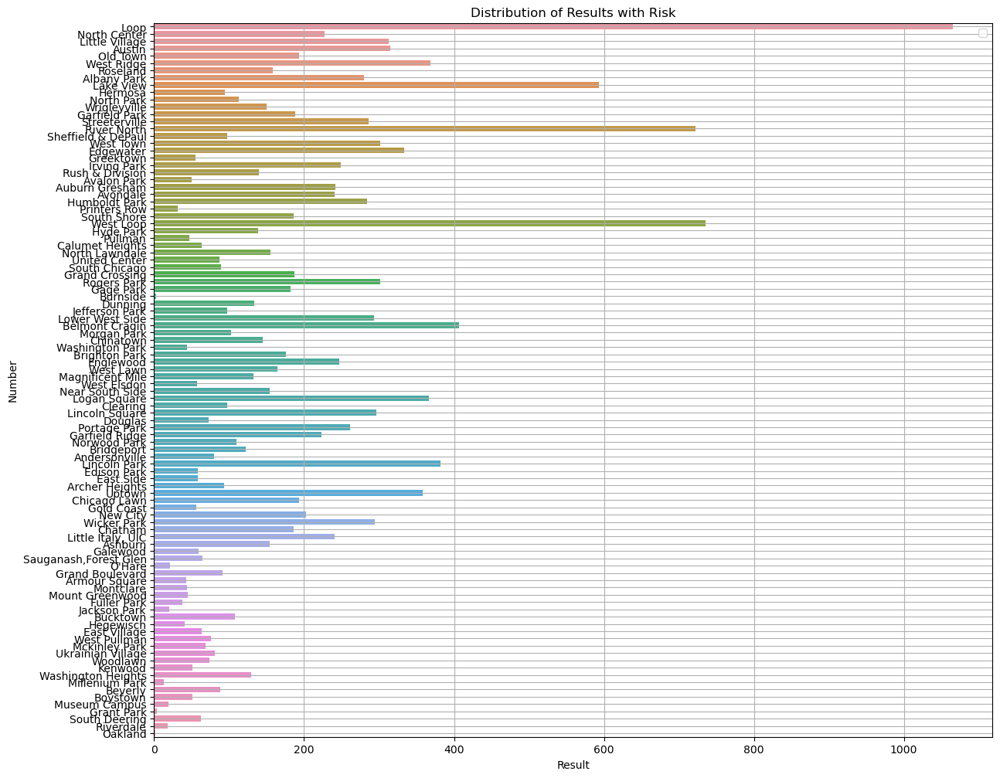

In [240]:
plt.figure(figsize = (14, 12))
ax = sns.countplot(y = 'pri_neigh', data = inspect_wd_neighbrhd)
# ax.bar_label(ax.containers[0])
ax.set(xlabel ="Result", ylabel = "Number", title ='Distribution of Results with Risk')
ax.legend(loc = "upper right")
plt.grid()

In [241]:
inspect_wd_neighbrhd.to_csv(os.path.join(RESULT_DIR, 'FoodInspectionWdNeighbourhood_20220308.csv'))